In [1]:
from PIL import Image, ImageChops

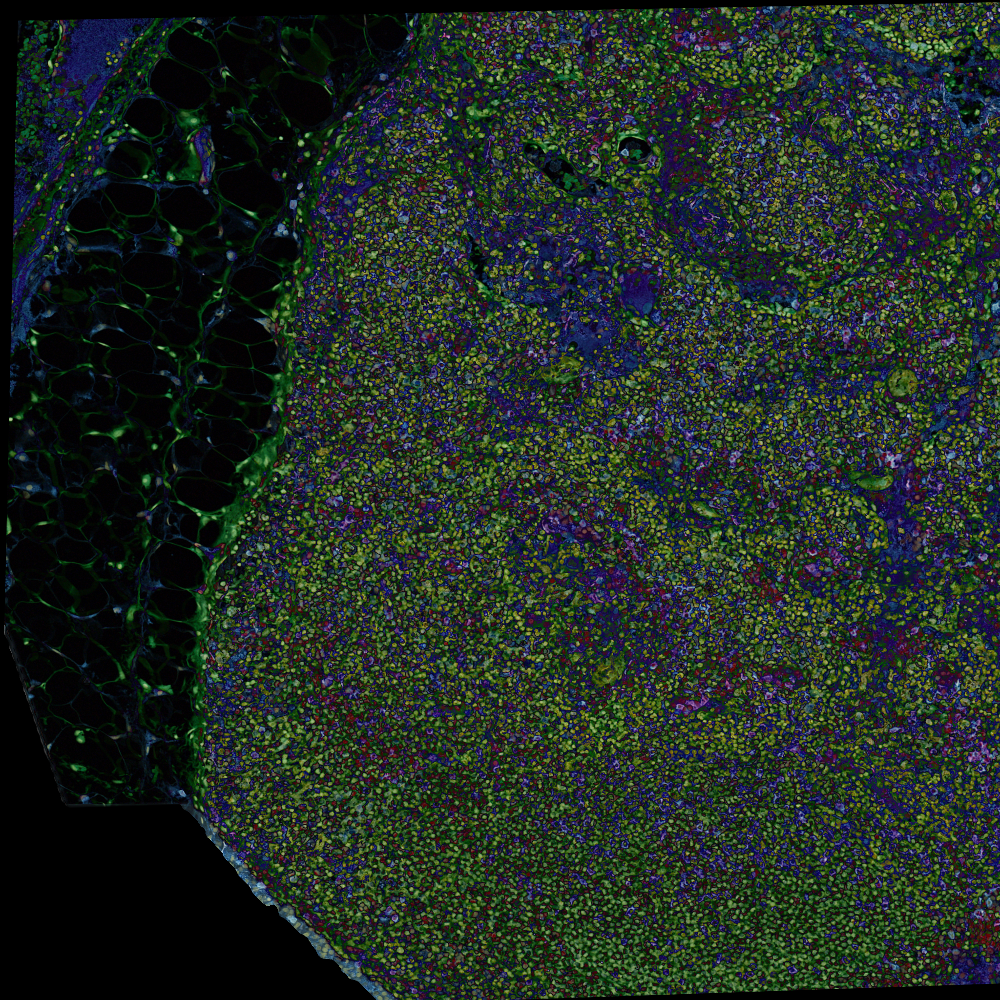

In [29]:
img1, img2 = Image.open('data/membrane/train_data/x/3.png'), Image.open('data/membrane/train_data/y/3.png')
diff = ImageChops.difference(img1, img2)
diff
# if diff.getbbox():
#     diff.show()
# else:
#     print("No difference at all!")

In [4]:
import cv2
import imutils
import numpy as np
from skimage.metrics import structural_similarity

img_num = 1
# Load images
img1 = cv2.imread("data/membrane/IMAGES/r/real_{}.png".format(img_num))
img2 = cv2.imread("data/membrane/IMAGES/f/fake_{}.png".format(img_num))

# Resize
img1 = cv2.resize(img1, (512,512))
img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]))

# Grayscale
g1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
g2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# Find the difference between two images
# Compute the mean structural similarity index
(similar, diff) = structural_similarity(g1,g2,full=True)

# diff is in range [0,1]. Convert it in range [0,255]
diff = (diff*255).astype("uint8")
# cv2.imshow("Difference", diff)

# Apply threshold
thresh = cv2.threshold(diff, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]

# Find contours
contours = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contours = imutils.grab_contours(contours)

# Loop over each contour
for contour in contours:
    if cv2.contourArea(contour) > 100:
        # Calculate bounding box
        x,y,w,h = cv2.boundingRect(contour)
        # Draw rectangle - bounding box
        cv2.rectangle(img1, (x,y), (x+w, y+h), (0,0,255), 2)
        cv2.rectangle(img2, (x,y), (x+w, y+h), (0,0,255), 2)
        cv2.putText(img2, "Similarity: " + str(similar), (10,30), cv2.FONT_HERSHEY_SIMPLEX, .7, (0,0,255), 2)

# Show final images with differences
x = np.zeros((512,10,3), np.uint8)
result = np.hstack((img1, x, img2))
cv2.imshow("Differences", result)

cv2.waitKey(0)
cv2.destroyAllWindows()

In [9]:
import cv2
import numpy as np
from skimage.metrics import structural_similarity

def zoom(img, zoom_factor=1.5):
    return cv2.resize(img, None, fx=zoom_factor, fy=zoom_factor)

img_num = 10
# Load images
img1 = cv2.imread("data/membrane/IMAGES/r/real_{}.png".format(img_num))
img2 = cv2.imread("data/membrane/IMAGES/f/fake_{}.png".format(img_num))
# img2 = cv2.imread("data/membrane/test_result5/{}_predict.png".format(img_num-1))

# img1 = cv2.resize(img1, (512,512))
# img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]))

g1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
g2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

(score, diff) = structural_similarity(g1,g2,full=True)
diff = (diff*255).astype("uint8")
# cv2.imshow("Difference", diff)

_, thresh = cv2.threshold(diff, 20, 255, cv2.THRESH_BINARY_INV)

contours = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]
contours = [c for c in contours if cv2.contourArea(c) > 80]

filled_img1 = img1.copy()
filled_img2 = img2.copy()

for c in contours:
    x,y,w,h = cv2.boundingRect(c)
    cv2.rectangle(img1, (x,y), (x+w, y+h), (0,0,255), 4)
#     zoomed = zoom(img2,1.5)
#     print("x:",x,"x+w:",x+w)
#     cv2.imshow("Zoomed",img1[x:x+w, y:y+h])
#     cv2.waitKey(0)
#     cv2.destroyAllWindows()
    cv2.rectangle(img2, (x,y), (x+w, y+h), (0,0,255), 4)
    cv2.drawContours(filled_img1, [c], 0, (0,255,0), -1)
    cv2.drawContours(filled_img2, [c], 0, (0,255,0), -1)
    cv2.putText(img2, "Similarity: " + str(score), (10,60), cv2.FONT_HERSHEY_SIMPLEX, 2, (0,0,255), 5)

# Show final images with differences
# x = np.zeros((512,10,3), np.uint8)
x = np.zeros((2048,10,3), np.uint8)
result = np.hstack((img1, x, img2))
result2 = np.hstack((filled_img1, x, filled_img2))
cv2.imshow("Differences", cv2.resize(result, None, fx=0.35, fy=0.35))
cv2.imshow('Filled img2', cv2.resize(result2, None, fx=0.35, fy=0.35))

cv2.waitKey(0)
cv2.destroyAllWindows()

# while True:
#     cv2.imshow("window1",img1)
#     cv2.imshow("window2",img2)
#     cv2.imshow("window3",thresh)
    
#     if cv2.waitKey(0) == 27:
#         cv2.destroyAllWindows()
#         break



# height, width = img1.shape[:2]


zoomed = zoom(img1, 1)
# Zoomed: 794 × 825 


cropped = zoomed[0:550, 0:529] # Wrong area
cv2.imshow("Zoomed",cropped)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [12]:
import cv2
import numpy as np
from skimage.metrics import structural_similarity

img_num = 2
# Load images
img1 = cv2.imread("data/membrane/IMAGES/r/real_{}.png".format(img_num))
img2 = cv2.imread("data/membrane/IMAGES/f/fake_{}.png".format(img_num))

g1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
g2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

(score, diff) = structural_similarity(g1,g2,full=True)
print("Image Similarity: {:.4f}%".format(score * 100))
diff = (diff*255).astype("uint8")

_, thresh = cv2.threshold(diff, 20, 255, cv2.THRESH_BINARY_INV)

contours = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]
contours = [c for c in contours if cv2.contourArea(c) > 80]

filled_img1 = img1.copy()
filled_img2 = img2.copy()

for c in contours:
    x,y,w,h = cv2.boundingRect(c)
    cv2.rectangle(img1, (x,y), (x+w, y+h), (0,0,255), 4)
    cv2.rectangle(img2, (x,y), (x+w, y+h), (0,0,255), 4)
    cv2.drawContours(filled_img1, [c], 0, (0,255,0), -1)
    cv2.drawContours(filled_img2, [c], 0, (0,255,0), -1)
    cv2.putText(img2, "Similarity: " + str(score), (10,60), cv2.FONT_HERSHEY_SIMPLEX, 2, (0,0,255), 5)

# Show final images with differences
x = np.zeros((2048,10,3), np.uint8)
result = np.hstack((img1, x, img2))
result2 = np.hstack((filled_img1, x, filled_img2))
cv2.imshow("Differences", cv2.resize(result, None, fx=0.35, fy=0.35))
cv2.imshow('Filled img2', cv2.resize(result2, None, fx=0.35, fy=0.35))

cv2.waitKey(0)
cv2.destroyAllWindows()

Image Similarity: 60.2536%


In [8]:
from skimage.metrics import structural_similarity
import cv2
import numpy as np

img_num = 4
# Load images
before = cv2.imread("data/membrane/IMAGES/r/real_{}.png".format(img_num))
after = cv2.imread("data/membrane/IMAGES/f/fake_{}.png".format(img_num))

# Convert images to grayscale
before_gray = cv2.cvtColor(before, cv2.COLOR_BGR2GRAY)
after_gray = cv2.cvtColor(after, cv2.COLOR_BGR2GRAY)

# Compute SSIM between the two images
(score, diff) = structural_similarity(before_gray, after_gray, full=True)
print("Image Similarity: {:.4f}%".format(score * 100))

# The diff image contains the actual image differences between the two images
# and is represented as a floating point data type in the range [0,1] 
# so we must convert the array to 8-bit unsigned integers in the range
# [0,255] before we can use it with OpenCV
diff = (diff * 255).astype("uint8")
diff_box = cv2.merge([diff, diff, diff])

# Threshold the difference image, followed by finding contours to
# obtain the regions of the two input images that differ
thresh = cv2.threshold(diff, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
contours = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contours = contours[0] if len(contours) == 2 else contours[1]

mask = np.zeros(before.shape, dtype='uint8')
filled_after = after.copy()

for c in contours:
    area = cv2.contourArea(c)
    if area > 40:
        x,y,w,h = cv2.boundingRect(c)
        cv2.rectangle(before, (x, y), (x + w, y + h), (36,255,12), 2)
        cv2.rectangle(after, (x, y), (x + w, y + h), (36,255,12), 2)
        cv2.rectangle(diff_box, (x, y), (x + w, y + h), (36,255,12), 2)
        cv2.drawContours(mask, [c], 0, (255,255,255), -1)
        cv2.drawContours(filled_after, [c], 0, (0,255,0), -1)

cv2.imshow('before', cv2.resize(before, None, fx=0.3, fy=0.3))
cv2.imshow('after',cv2.resize(after, None, fx=0.3, fy=0.3))
# cv2.imshow('diff', cv2.resize(diff, None, fx=0.3, fy=0.3))
# cv2.imshow('diff_box', cv2.resize(diff_box, None, fx=0.3, fy=0.3))
# cv2.imshow('mask', cv2.resize(mask, None, fx=0.3, fy=0.3))
cv2.imshow('filled after', cv2.resize(filled_after, None, fx=0.3, fy=0.3))
cv2.waitKey(0)
cv2.destroyAllWindows()

Image Similarity: 65.5831%
